# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier ---- Luke Xu

In this notebook, I build a traffic sign recognition classifier based on the German Traffic sign data set.  I used several data preprocessing techniques, compared two different CNN structure and received close to human performance on the testing set. 

In addition to implementing code, I did many experiments to get a better understanding of overfitting, underfitting and the effect of various hyper parameters. 

**At the end I get test accuracy is 97.22% **



---
## Step 0: Load The Data

In [1]:
# Load pickled data
import pickle

training_file = 'train.p'
testing_file = 'test.p'

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)
    
X_train, y_train = train['features'], train['labels']
X_test, y_test = test['features'], test['labels']

---

## Step 1: Dataset Summary & Exploration

The pickled data is a dictionary with 4 key/value pairs:

- `'features'` is a 4D array containing raw pixel data of the traffic sign images, (num examples, width, height, channels).
- `'labels'` is a 2D array containing the label/class id of the traffic sign. The file `signnames.csv` contains id -> name mappings for each id.
- `'sizes'` is a list containing tuples, (width, height) representing the the original width and height the image.
- `'coords'` is a list containing tuples, (x1, y1, x2, y2) representing coordinates of a bounding box around the sign in the image. **THESE COORDINATES ASSUME THE ORIGINAL IMAGE. THE PICKLED DATA CONTAINS RESIZED VERSIONS (32 by 32) OF THESE IMAGES**

Complete the basic data summary below.

In [2]:
# Get validation data from training
from sklearn.model_selection import train_test_split
X_train, X_validation, y_train, y_validation = train_test_split(
    X_train, y_train, test_size=0.25, random_state=42)
assert(len(X_train) == len(y_train))
assert(len(X_validation) == len(y_validation))
assert(len(X_test) == len(y_test))

n_train = len(X_train)
n_test = len(X_test)
image_shape = X_train[0].shape
n_classes = len(set(list(y_train)))

print("Number of training examples =", n_train)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)

Number of training examples = 29406
Number of testing examples = 12630
Image data shape = (32, 32, 3)
Number of classes = 43


Visualize the German Traffic Signs Dataset using the pickled file(s). This is open ended, suggestions include: plotting traffic sign images, plotting the count of each sign, etc.

The [Matplotlib](http://matplotlib.org/) [examples](http://matplotlib.org/examples/index.html) and [gallery](http://matplotlib.org/gallery.html) pages are a great resource for doing visualizations in Python.

**NOTE:** It's recommended you start with something simple first. If you wish to do more, come back to it after you've completed the rest of the sections.

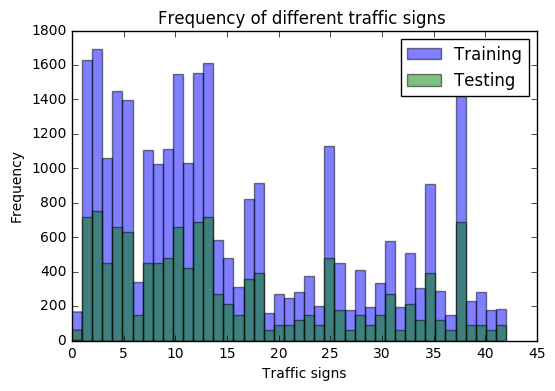

In [3]:
import random
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
#from augmentation import transform_image
import cv2

plt.hist(y_train,n_classes,alpha=0.5)
plt.hist(y_test,n_classes,alpha=0.5)
plt.title("Frequency of different traffic signs ")
plt.xlabel("Traffic signs")
plt.ylabel("Frequency")
plt.legend(('Training', 'Testing'))
plt.show()  

----

## Step 2: Design and Test a Model Architecture

Design and implement a deep learning model that learns to recognize traffic signs. Train and test your model on the [German Traffic Sign Dataset](http://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset).

There are various aspects to consider when thinking about this problem:

- Neural network architecture
- Play around preprocessing techniques (normalization, rgb to grayscale, etc)
- Number of examples per label (some have more than others).
- Generate fake data.

Here is an example of a [published baseline model on this problem](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). It's not required to be familiar with the approach used in the paper but, it's good practice to try to read papers like these.

**NOTE:** The LeNet-5 implementation shown in the [classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/601ae704-1035-4287-8b11-e2c2716217ad/concepts/d4aca031-508f-4e0b-b493-e7b706120f81) at the end of the CNN lesson is a solid starting point. You'll have to change the number of classes and possibly the preprocessing, but aside from that it's plug and play!

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

43 43


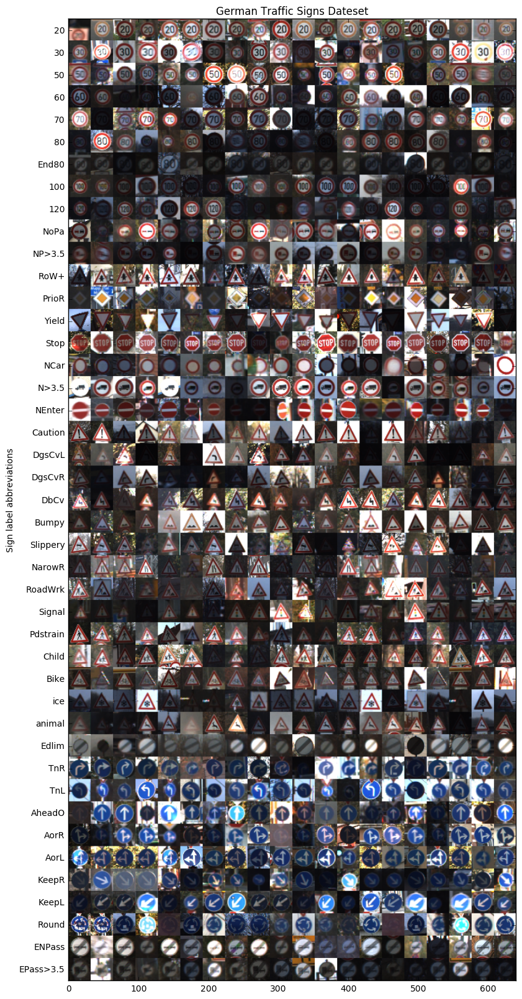

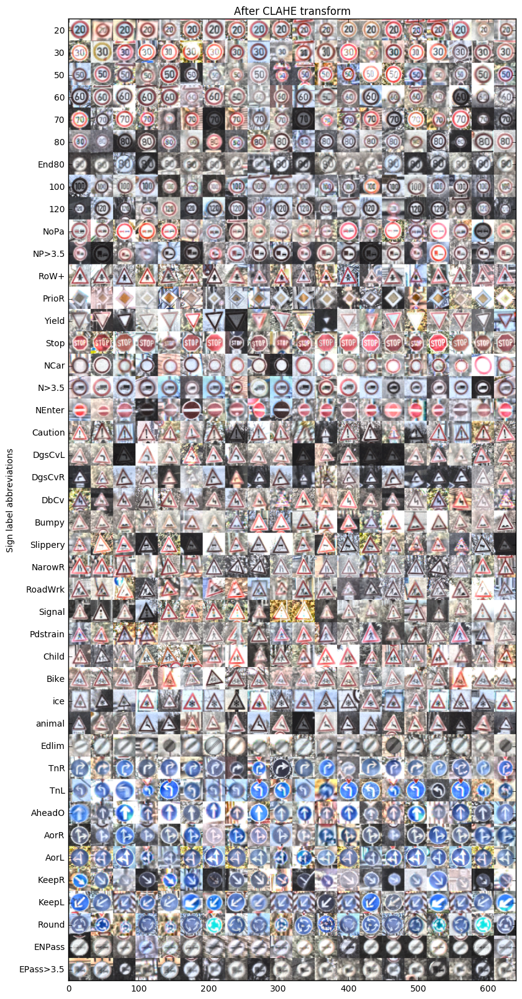

In [4]:
def CLAHE_transform(img):
    #Converting image to LAB Color model
    lab= cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    #Splitting the LAB image to different channels
    l, a, b = cv2.split(lab)
    #Applying CLAHE to L-channel
    clahe = cv2.createCLAHE(clipLimit=5, tileGridSize=(4,4))
    cl = clahe.apply(l)
    #Merge the CLAHE enhanced L-channel with the a and b channel
    limg = cv2.merge((cl,a,b))
    #Converting image from LAB Color model to RGB model
    final = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
    return final

def plot_image(data = X_train,label = y_train,
               title = 'German Traffic Signs Dateset',
               NUM_OF_IMAGE =20,transform = False ):
    #Randomly find n images for each class
    
    #flag used to find n images for each class
    n=[0]*len(sign_list)
    image = [None]*len(sign_list)
    # Add image with the same index together as a row 
    # Until all index has at least N images
    while sum(n)<NUM_OF_IMAGE*len(sign_list):
        index = random.randint(0, len(data)-1)
        for j in range(len(sign_list)):
            if label[index] == j:
                if n[j] == 0:
                    image[j] = data[index]
                    if transform:
                        image[j]=CLAHE_transform(image[j])
                    else:
                        image[j]=image[j]
                elif n[j] < NUM_OF_IMAGE:
                    if transform:
                        image[j] = np.append(image[j],CLAHE_transform(data[index]),axis =1)
                    else:
                        image[j] = np.append(image[j],data[index],axis =1)
                else:
                    continue
                n[j]+=1
    img = image[0]
    for i in range(len(sign_list)-1):
        img = np.append(img,image[i+1],axis = 0)

    y_pos = np.arange(n_classes)*32+16

    plt.figure(figsize=(120,20))
    plt.yticks(y_pos, sign_list)
    plt.ylabel('Sign label abbreviations')
    plt.title(title)
    plt.imshow(img)
    
#Looking into the categories and use shorter names to represent the meaning.
import pandas as pd
names = pd.read_csv('signnames.csv')
sign_list=['20','30','50','60','70','80','End80','100','120','NoPa','NP>3.5',
     'RoW+','PrioR','Yield','Stop','NCar','N>3.5','NEnter','Caution','DgsCvL','DgsCvR',
     'DbCv','Bumpy','Slippery','NarowR','RoadWrk','Signal','Pdstrain','Child','Bike','ice',
     'animal','Edlim','TnR','TnL','AheadO','AorR','AorL','KeepR','KeepL','Round','ENPass','EPass>3.5']
print(len(names),len(sign_list))

#plot image before and after transform
plot_image()
plot_image(title = 'After CLAHE transform', transform = True)



In [5]:
def transform_image(img,ang_range=10,shear_range=5,trans_range=10):
    '''
    This function transforms images to generate new images.
    The function takes in following arguments,
    1- Image
    2- ang_range: Range of angles for rotation
    3- shear_range: Range of values to apply affine transform to
    4- trans_range: Range of values to apply translations over. 
    
    A Random uniform distribution is used to generate different parameters for transformation
    '''   
    # Rotation

    ang_rot = np.random.uniform(ang_range)-ang_range/2
    rows,cols,ch = img.shape    
    Rot_M = cv2.getRotationMatrix2D((cols/2,rows/2),ang_rot,1)

    # Translation
    tr_x = trans_range*np.random.uniform()-trans_range/2
    tr_y = trans_range*np.random.uniform()-trans_range/2
    Trans_M = np.float32([[1,0,tr_x],[0,1,tr_y]])

    # Shear
    pts1 = np.float32([[5,5],[20,5],[5,20]])

    pt1 = 5+shear_range*np.random.uniform()-shear_range/2
    pt2 = 20+shear_range*np.random.uniform()-shear_range/2
    
    # Brightness 
    

    pts2 = np.float32([[pt1,5],[pt2,pt1],[5,pt2]])

    shear_M = cv2.getAffineTransform(pts1,pts2)
        
    img = cv2.warpAffine(img,Rot_M,(cols,rows))
    img = cv2.warpAffine(img,Trans_M,(cols,rows))
    img = cv2.warpAffine(img,shear_M,(cols,rows))
    
    return img


augmented_X = []
augmented_y = []


    # Apply CLAHE transform to X_test, X_validation as well
for index in range(len(X_test)):
    X_test[index] = CLAHE_transform(X_test[index])
for index in range(len(X_validation)):
    X_validation[index] =CLAHE_transform(X_validation[index])

for index in range(len(X_train)):
    #Add original image and index
    augmented_X.append(CLAHE_transform(X_train[index]))
    augmented_y.append(y_train[index])

    for i in range(8):
        #Add more data 
        augmented_X.append(transform_image(CLAHE_transform(X_train[index])))
        augmented_y.append(y_train[index])

264654
29406


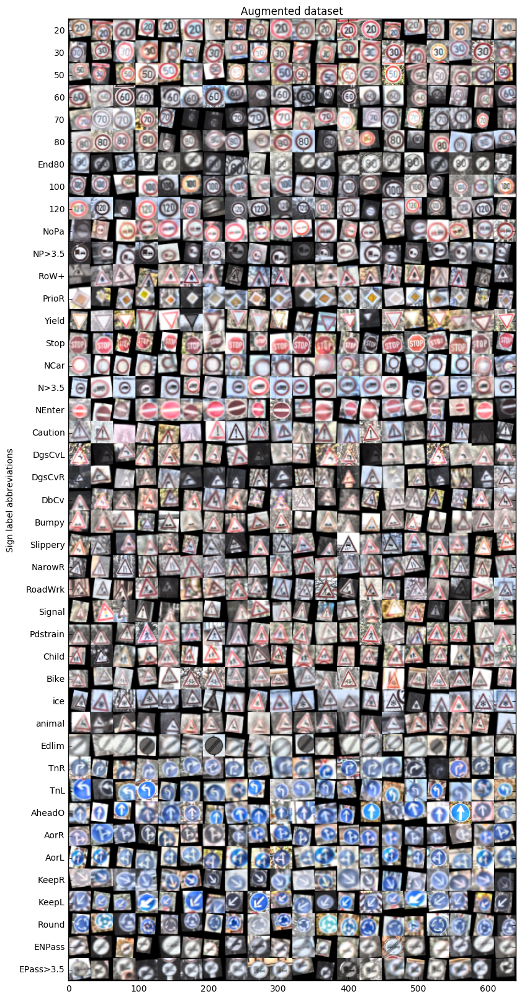

In [6]:
plot_image(data = augmented_X,label = augmented_y,title='Augmented dataset')
print(len(augmented_X))
print(len(X_train))

264654 264654


'DgsCvR'

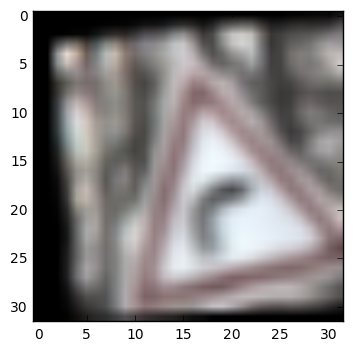

In [7]:
from sklearn.utils import shuffle
X_train, y_train = shuffle(augmented_X, augmented_y)

#X_train, y_train = shuffle(X_train, y_train)
print(len(X_train),len(y_train))

import tensorflow as tf
from tensorflow.contrib.layers import flatten
plt.imshow(X_train[-1])
sign_list[int(y_train[-1])]

In [36]:

def LeNet(x,dropout):    
    # Hyperparameters
    mu = 0
    sigma = 0.1
    
    # SOLUTION: Layer 1: Convolutional. Input = 32x32x1. Output = 28x28x6.
    conv1_W = tf.Variable(tf.truncated_normal(shape=(5, 5, 3, 6), mean = mu, stddev = sigma))
    conv1_b = tf.Variable(tf.zeros(6))
    conv1   = tf.nn.conv2d(x, conv1_W, strides=[1, 1, 1, 1], padding='VALID') + conv1_b
    # SOLUTION: Activation.
    conv1 = tf.nn.relu(conv1)
    # SOLUTION: Pooling. Input = 28x28x6. Output = 14x14x6.
    conv1 = tf.nn.max_pool(conv1, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')

    
    
    # SOLUTION: Layer 2: Convolutional. Output = 10x10x16.
    conv2_W = tf.Variable(tf.truncated_normal(shape=(5, 5, 6, 16), mean = mu, stddev = sigma))
    conv2_b = tf.Variable(tf.zeros(16))
    conv2   = tf.nn.conv2d(conv1, conv2_W, strides=[1, 1, 1, 1], padding='VALID') + conv2_b
    # SOLUTION: Activation.
    conv2 = tf.nn.relu(conv2)
    # SOLUTION: Pooling. Input = 10x10x16. Output = 5x5x16.
    conv2 = tf.nn.max_pool(conv2, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')

    # SOLUTION: Flatten. Input = 5x5x16. Output = 400.
    fc0   = flatten(conv2)
    
    # SOLUTION: Layer 3: Fully Connected. Input = 400. Output = 120.
    fc1_W = tf.Variable(tf.truncated_normal(shape=(400, 120), mean = mu, stddev = sigma))
    fc1_b = tf.Variable(tf.zeros(120))
    fc1   = tf.matmul(fc0, fc1_W) + fc1_b
    
    # SOLUTION: Activation.
    fc1    = tf.nn.relu(fc1)
    fc1 = tf.nn.dropout(fc1, dropout)

    # SOLUTION: Layer 4: Fully Connected. Input = 120. Output = 84.
    fc2_W  = tf.Variable(tf.truncated_normal(shape=(120, 84), mean = mu, stddev = sigma))
    fc2_b  = tf.Variable(tf.zeros(84))
    fc2    = tf.matmul(fc1, fc2_W) + fc2_b
    
    # SOLUTION: Activation.
    fc2    = tf.nn.relu(fc2)

    # SOLUTION: Layer 5: Fully Connected. Input = 84. Output = 43.
    fc3_W  = tf.Variable(tf.truncated_normal(shape=(84, 43), mean = mu, stddev = sigma))
    fc3_b  = tf.Variable(tf.zeros(43))
    logits = tf.matmul(fc2, fc3_W) + fc3_b
    
    return logits

In [8]:
from tensorflow.contrib.layers import flatten

def conv_net(x,dropout = 0):    
    # Hyperparameters
    mu = 0
    sigma = 0.1
    
    # SOLUTION: Layer 1: Convolutional. Input = 32x32x1. Output = 28x28x100.
    conv1_W = tf.Variable(tf.truncated_normal(shape=(5, 5, 3, 100), mean = mu, stddev = sigma))
    conv1_b = tf.Variable(tf.zeros(100))
    conv1   = tf.nn.conv2d(x, conv1_W, strides=[1, 1, 1, 1], padding='VALID') + conv1_b
    conv1 = tf.nn.relu(conv1)
    # SOLUTION: Pooling. Input = 28x28x100. Output = 14x14x100.
    conv1 = tf.nn.max_pool(conv1, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')

    
    # SOLUTION: Layer 2: Convolutional. Output = 12x12x150.
    conv2_W = tf.Variable(tf.truncated_normal(shape=(3, 3, 100, 150), mean = mu, stddev = sigma))
    conv2_b = tf.Variable(tf.zeros(150))
    conv2   = tf.nn.conv2d(conv1, conv2_W, strides=[1, 1, 1, 1], padding='VALID') + conv2_b
    # SOLUTION: Activation.
    conv2 = tf.nn.relu(conv2)
    # SOLUTION: Pooling. Input =12x12x150.. Output = 6x6x150.
    conv2 = tf.nn.max_pool(conv2, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    
    # SOLUTION: Layer 3: Convolutional. Output = 5x5x250.
    conv3_W = tf.Variable(tf.truncated_normal(shape=(2, 2, 150, 250), mean = mu, stddev = sigma))
    conv3_b = tf.Variable(tf.zeros(250))
    conv3   = tf.nn.conv2d(conv2, conv3_W, strides=[1, 1, 1, 1], padding='VALID') + conv3_b
    # SOLUTION: Activation.
    conv3 = tf.nn.relu(conv3)
    # SOLUTION: Pooling. Input = 5x5x250. Output =2x2x250.
    conv3 = tf.nn.max_pool(conv3, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')
    
    
    # SOLUTION: Flatten. Input = 2x2x250. Output = 300.
    fc0   = flatten(conv3)
       
    
    
    # SOLUTION: Layer 3: Fully Connected. Input = 1000. Output = 300.
    fc1_W = tf.Variable(tf.truncated_normal(shape=(1000, 300), mean = mu, stddev = sigma))
    fc1_b = tf.Variable(tf.zeros(300))
    fc1   = tf.matmul(fc0, fc1_W) + fc1_b
    # SOLUTION: Activation.
    fc1    = tf.nn.relu(fc1)
    fc1 = tf.nn.dropout(fc1, dropout)

    # SOLUTION: Layer 4: Fully Connected. Input = 300. Output = 100.
    fc2_W  = tf.Variable(tf.truncated_normal(shape=(300, 43), mean = mu, stddev = sigma))
    fc2_b  = tf.Variable(tf.zeros(43))
    logits    = tf.matmul(fc1, fc2_W) + fc2_b
    #logits = fc2
    
#     # SOLUTION: Activation.
#     fc2    = tf.nn.relu(fc2)

#     # SOLUTION: Layer 5: Fully Connected. Input = 100. Output = 43.
#     fc3_W  = tf.Variable(tf.truncated_normal(shape=(100, 43), mean = mu, stddev = sigma))
#     fc3_b  = tf.Variable(tf.zeros(43))
#     logits = tf.matmul(fc2, fc3_W) + fc3_b
    
    return logits

In [9]:
rand = 10**(-np.random.uniform(3,6,10))

In [ ]:
rand

array([  1.00009853e-06,   2.53323187e-06,   2.02059829e-05,
         4.17324987e-04,   5.66564425e-05,   9.74566992e-04,
         5.16106526e-04,   2.97530451e-05,   1.02637939e-04,
         1.19830024e-04])

learning rate =  1.00009852798e-06
Training...

EPOCH 1 ...
Train Accuracy = 0.0560 ~ Validation Accuracy = 0.064 Train loss = 295.7520 Validation loss = 301.431
EPOCH 2 ...
Train Accuracy = 0.0707 ~ Validation Accuracy = 0.097 Train loss = 165.3482 Validation loss = 168.575
EPOCH 3 ...
Train Accuracy = 0.0777 ~ Validation Accuracy = 0.108 Train loss = 103.1480 Validation loss = 105.236
EPOCH 4 ...
Train Accuracy = 0.0794 ~ Validation Accuracy = 0.108 Train loss = 55.2990 Validation loss = 57.384
EPOCH 5 ...
Train Accuracy = 0.0476 ~ Validation Accuracy = 0.067 Train loss = 15.6640 Validation loss = 16.807
EPOCH 6 ...
Train Accuracy = 0.0550 ~ Validation Accuracy = 0.063 Train loss = 6.1534 Validation loss = 6.165
EPOCH 7 ...
Train Accuracy = 0.0537 ~ Validation Accuracy = 0.063 Train loss = 4.5699 Validation loss = 4.434
EPOCH 8 ...
Train Accuracy = 0.0520 ~ Validation Accuracy = 0.060 Train loss = 4.1096 Validation loss = 4.002
EPOCH 9 ...
Train Accuracy = 0.0512 ~ Validation Accurac

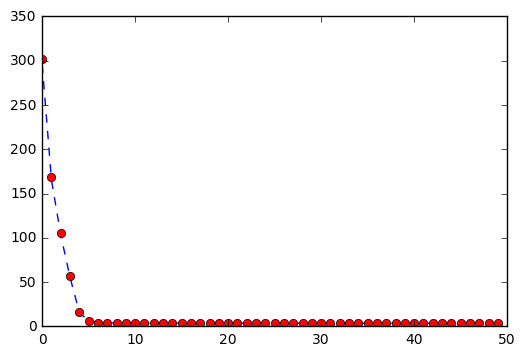

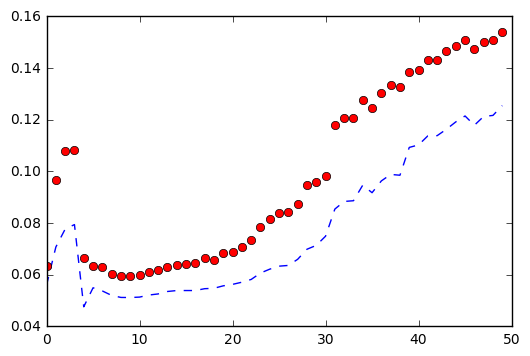

Model saved
learning rate =  2.53323186503e-06
Training...

EPOCH 1 ...
Train Accuracy = 0.0849 ~ Validation Accuracy = 0.137 Train loss = 150.8821 Validation loss = 161.148
EPOCH 2 ...
Train Accuracy = 0.0527 ~ Validation Accuracy = 0.064 Train loss = 27.2654 Validation loss = 30.167
EPOCH 3 ...
Train Accuracy = 0.0415 ~ Validation Accuracy = 0.040 Train loss = 5.5769 Validation loss = 5.508
EPOCH 4 ...
Train Accuracy = 0.0497 ~ Validation Accuracy = 0.048 Train loss = 4.2359 Validation loss = 4.161
EPOCH 5 ...
Train Accuracy = 0.0523 ~ Validation Accuracy = 0.052 Train loss = 3.9170 Validation loss = 3.886
EPOCH 6 ...
Train Accuracy = 0.0533 ~ Validation Accuracy = 0.053 Train loss = 3.8101 Validation loss = 3.803
EPOCH 7 ...
Train Accuracy = 0.0586 ~ Validation Accuracy = 0.058 Train loss = 3.7714 Validation loss = 3.773
EPOCH 8 ...
Train Accuracy = 0.0610 ~ Validation Accuracy = 0.060 Train loss = 3.7507 Validation loss = 3.755
EPOCH 9 ...
Train Accuracy = 0.0642 ~ Validation Accur

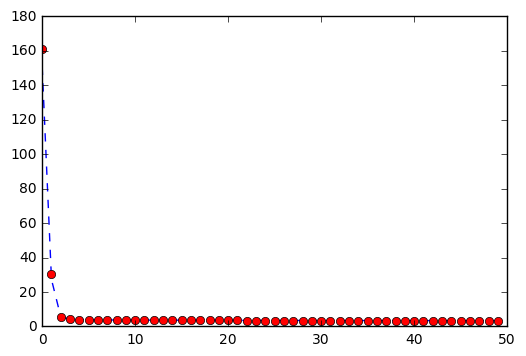

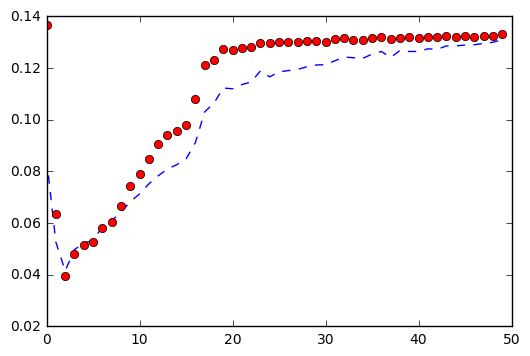

Model saved
learning rate =  2.02059829053e-05
Training...

EPOCH 1 ...
Train Accuracy = 0.0573 ~ Validation Accuracy = 0.062 Train loss = 3.9752 Validation loss = 3.900
EPOCH 2 ...
Train Accuracy = 0.0644 ~ Validation Accuracy = 0.078 Train loss = 3.7429 Validation loss = 3.719
EPOCH 3 ...
Train Accuracy = 0.0740 ~ Validation Accuracy = 0.090 Train loss = 3.6698 Validation loss = 3.622
EPOCH 4 ...
Train Accuracy = 0.0829 ~ Validation Accuracy = 0.105 Train loss = 3.6161 Validation loss = 3.541
EPOCH 5 ...
Train Accuracy = 0.0968 ~ Validation Accuracy = 0.112 Train loss = 3.5639 Validation loss = 3.492
EPOCH 6 ...
Train Accuracy = 0.0959 ~ Validation Accuracy = 0.115 Train loss = 3.5298 Validation loss = 3.461
EPOCH 7 ...
Train Accuracy = 0.1209 ~ Validation Accuracy = 0.145 Train loss = 3.4377 Validation loss = 3.340
EPOCH 8 ...
Train Accuracy = 0.1425 ~ Validation Accuracy = 0.180 Train loss = 3.3250 Validation loss = 3.171
EPOCH 9 ...
Train Accuracy = 0.1629 ~ Validation Accuracy = 

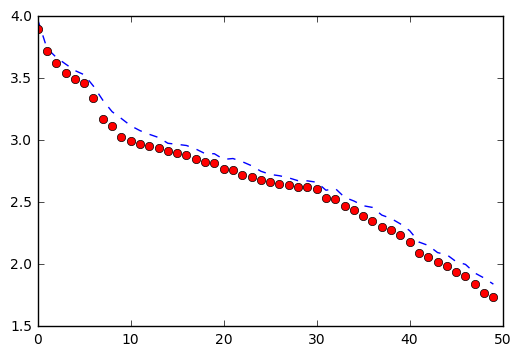

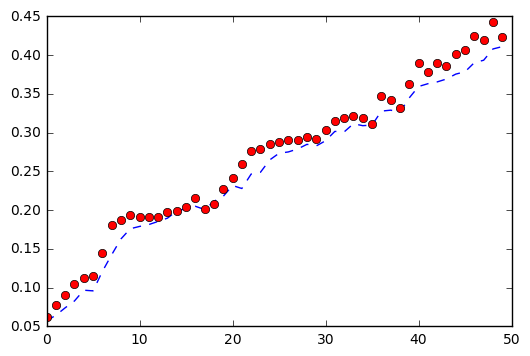

Model saved
learning rate =  0.000417324987047
Training...

EPOCH 1 ...
Train Accuracy = 0.0667 ~ Validation Accuracy = 0.078 Train loss = 3.5021 Validation loss = 3.482
EPOCH 2 ...
Train Accuracy = 0.0701 ~ Validation Accuracy = 0.080 Train loss = 3.4531 Validation loss = 3.416
EPOCH 3 ...
Train Accuracy = 0.1138 ~ Validation Accuracy = 0.138 Train loss = 3.3067 Validation loss = 3.212
EPOCH 4 ...
Train Accuracy = 0.1931 ~ Validation Accuracy = 0.198 Train loss = 2.9447 Validation loss = 2.865
EPOCH 5 ...
Train Accuracy = 0.2779 ~ Validation Accuracy = 0.298 Train loss = 2.5941 Validation loss = 2.452
EPOCH 6 ...
Train Accuracy = 0.3946 ~ Validation Accuracy = 0.421 Train loss = 2.0108 Validation loss = 1.914
EPOCH 7 ...
Train Accuracy = 0.4746 ~ Validation Accuracy = 0.495 Train loss = 1.6699 Validation loss = 1.575
EPOCH 8 ...
Train Accuracy = 0.5911 ~ Validation Accuracy = 0.623 Train loss = 1.2952 Validation loss = 1.217
EPOCH 9 ...
Train Accuracy = 0.7675 ~ Validation Accuracy = 

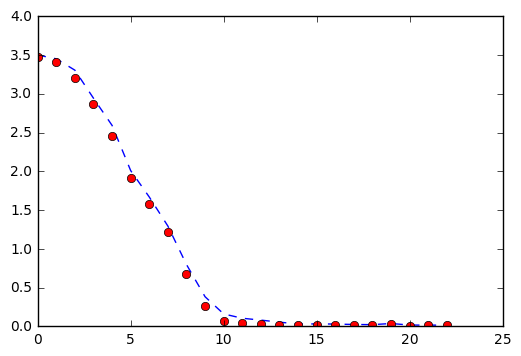

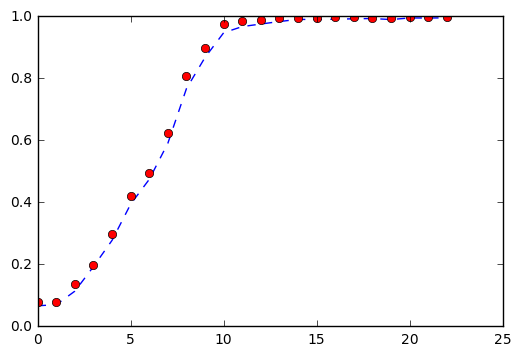

learning rate =  5.66564424791e-05
Training...

EPOCH 1 ...
Train Accuracy = 0.0538 ~ Validation Accuracy = 0.048 Train loss = 3.7283 Validation loss = 3.733
EPOCH 2 ...
Train Accuracy = 0.0677 ~ Validation Accuracy = 0.070 Train loss = 3.6328 Validation loss = 3.622
EPOCH 3 ...
Train Accuracy = 0.0739 ~ Validation Accuracy = 0.081 Train loss = 3.5701 Validation loss = 3.548
EPOCH 4 ...
Train Accuracy = 0.0974 ~ Validation Accuracy = 0.109 Train loss = 3.4620 Validation loss = 3.417
EPOCH 5 ...
Train Accuracy = 0.0828 ~ Validation Accuracy = 0.099 Train loss = 3.4853 Validation loss = 3.427
EPOCH 6 ...
Train Accuracy = 0.1117 ~ Validation Accuracy = 0.118 Train loss = 3.3205 Validation loss = 3.279
EPOCH 7 ...
Train Accuracy = 0.1470 ~ Validation Accuracy = 0.176 Train loss = 3.1908 Validation loss = 3.096
EPOCH 8 ...
Train Accuracy = 0.1758 ~ Validation Accuracy = 0.190 Train loss = 3.0847 Validation loss = 3.007
EPOCH 9 ...
Train Accuracy = 0.1762 ~ Validation Accuracy = 0.188 Train 

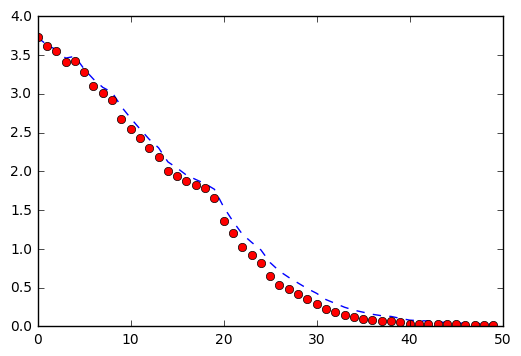

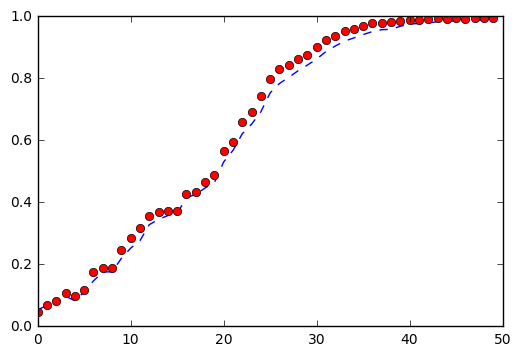

learning rate =  0.000974566991724
Training...

EPOCH 1 ...
Train Accuracy = 0.0659 ~ Validation Accuracy = 0.077 Train loss = 3.4632 Validation loss = 3.423
EPOCH 2 ...
Train Accuracy = 0.0575 ~ Validation Accuracy = 0.057 Train loss = 3.4867 Validation loss = 3.483
EPOCH 3 ...
Train Accuracy = 0.0575 ~ Validation Accuracy = 0.057 Train loss = 3.4875 Validation loss = 3.483
EPOCH 4 ...
Train Accuracy = 0.0575 ~ Validation Accuracy = 0.057 Train loss = 3.4865 Validation loss = 3.483
EPOCH 5 ...
Train Accuracy = 0.0575 ~ Validation Accuracy = 0.057 Train loss = 3.4865 Validation loss = 3.483
EPOCH 6 ...
Train Accuracy = 0.0575 ~ Validation Accuracy = 0.057 Train loss = 3.4865 Validation loss = 3.483
EPOCH 7 ...
Train Accuracy = 0.0575 ~ Validation Accuracy = 0.057 Train loss = 3.4866 Validation loss = 3.483
EPOCH 8 ...
Train Accuracy = 0.0575 ~ Validation Accuracy = 0.057 Train loss = 3.4865 Validation loss = 3.483
Early stop, last five validation loss mean is  3.48315064616


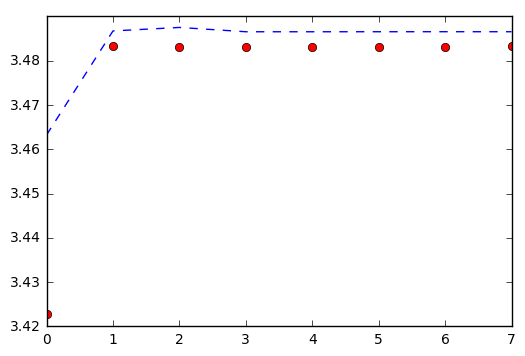

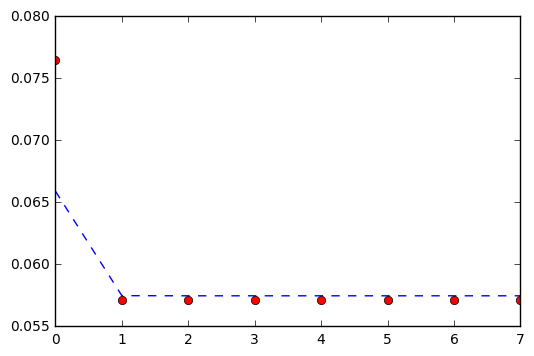

Model saved
learning rate =  0.000516106525701
Training...

EPOCH 1 ...
Train Accuracy = 0.0969 ~ Validation Accuracy = 0.121 Train loss = 3.3825 Validation loss = 3.288
EPOCH 2 ...
Train Accuracy = 0.1710 ~ Validation Accuracy = 0.188 Train loss = 2.9548 Validation loss = 2.854
EPOCH 3 ...
Train Accuracy = 0.2232 ~ Validation Accuracy = 0.240 Train loss = 2.7629 Validation loss = 2.676
EPOCH 4 ...
Train Accuracy = 0.2866 ~ Validation Accuracy = 0.310 Train loss = 2.4578 Validation loss = 2.334
EPOCH 5 ...
Train Accuracy = 0.2958 ~ Validation Accuracy = 0.292 Train loss = 2.1685 Validation loss = 2.092
EPOCH 6 ...
Train Accuracy = 0.4380 ~ Validation Accuracy = 0.452 Train loss = 1.7204 Validation loss = 1.644
EPOCH 7 ...
Train Accuracy = 0.6485 ~ Validation Accuracy = 0.684 Train loss = 1.0701 Validation loss = 0.922
EPOCH 8 ...
Train Accuracy = 0.8501 ~ Validation Accuracy = 0.907 Train loss = 0.4856 Validation loss = 0.308
EPOCH 9 ...
Train Accuracy = 0.9443 ~ Validation Accuracy = 

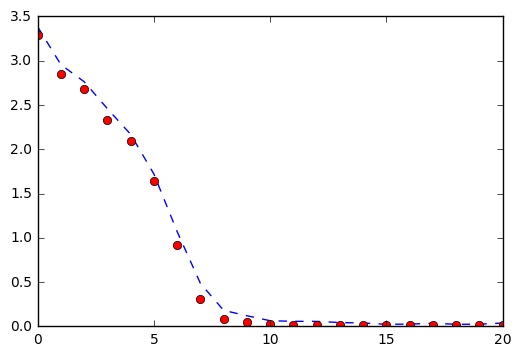

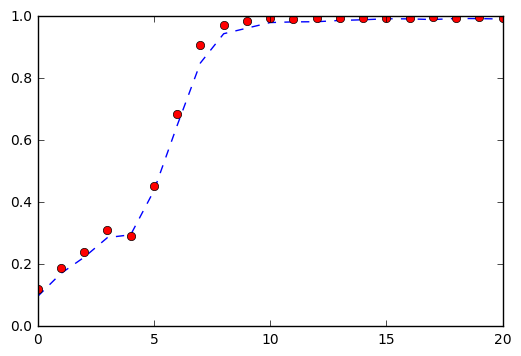

learning rate =  2.97530451143e-05
Training...

EPOCH 1 ...
Train Accuracy = 0.0544 ~ Validation Accuracy = 0.056 Train loss = 3.8723 Validation loss = 3.873
EPOCH 2 ...
Train Accuracy = 0.0546 ~ Validation Accuracy = 0.056 Train loss = 3.7213 Validation loss = 3.722
EPOCH 3 ...
Train Accuracy = 0.0578 ~ Validation Accuracy = 0.057 Train loss = 3.6811 Validation loss = 3.683
EPOCH 4 ...
Train Accuracy = 0.0577 ~ Validation Accuracy = 0.057 Train loss = 3.6549 Validation loss = 3.656
EPOCH 5 ...
Train Accuracy = 0.0576 ~ Validation Accuracy = 0.057 Train loss = 3.6327 Validation loss = 3.633
EPOCH 6 ...
Train Accuracy = 0.0575 ~ Validation Accuracy = 0.057 Train loss = 3.6137 Validation loss = 3.615
EPOCH 7 ...
Train Accuracy = 0.0575 ~ Validation Accuracy = 0.057 Train loss = 3.5960 Validation loss = 3.595
EPOCH 8 ...
Train Accuracy = 0.0575 ~ Validation Accuracy = 0.057 Train loss = 3.5808 Validation loss = 3.580
EPOCH 9 ...
Train Accuracy = 0.0575 ~ Validation Accuracy = 0.057 Train 

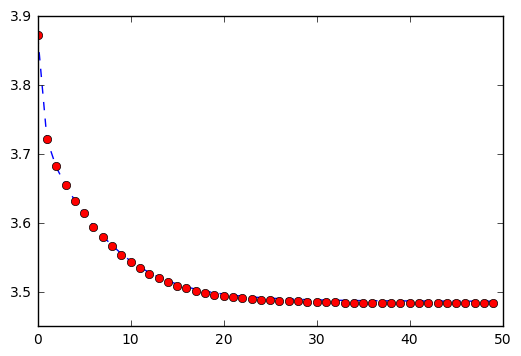

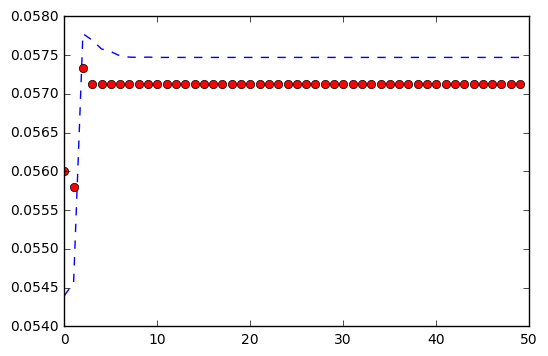

Model saved
learning rate =  0.000102637939021
Training...

EPOCH 1 ...
Train Accuracy = 0.0586 ~ Validation Accuracy = 0.057 Train loss = 3.6745 Validation loss = 3.675
EPOCH 2 ...
Train Accuracy = 0.0593 ~ Validation Accuracy = 0.058 Train loss = 3.5995 Validation loss = 3.602
EPOCH 3 ...
Train Accuracy = 0.0838 ~ Validation Accuracy = 0.086 Train loss = 3.4265 Validation loss = 3.402
EPOCH 4 ...
Train Accuracy = 0.0575 ~ Validation Accuracy = 0.057 Train loss = 3.5291 Validation loss = 3.527
EPOCH 5 ...
Train Accuracy = 0.1018 ~ Validation Accuracy = 0.117 Train loss = 3.2783 Validation loss = 3.232
EPOCH 6 ...
Train Accuracy = 0.1148 ~ Validation Accuracy = 0.106 Train loss = 3.2130 Validation loss = 3.170
EPOCH 7 ...
Train Accuracy = 0.1155 ~ Validation Accuracy = 0.118 Train loss = 3.2135 Validation loss = 3.158
EPOCH 8 ...
Train Accuracy = 0.1524 ~ Validation Accuracy = 0.164 Train loss = 3.0780 Validation loss = 3.010
EPOCH 9 ...
Train Accuracy = 0.1805 ~ Validation Accuracy = 

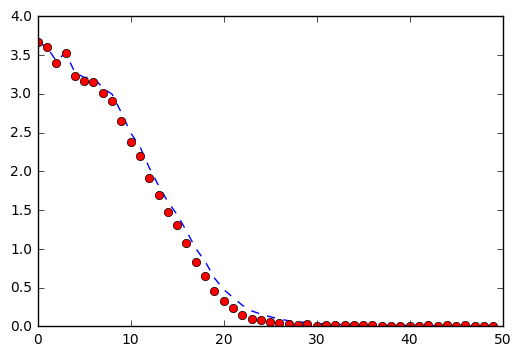

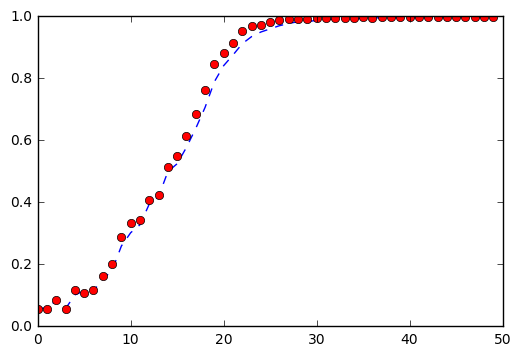

learning rate =  0.000119830023936
Training...

EPOCH 1 ...
Train Accuracy = 0.0578 ~ Validation Accuracy = 0.057 Train loss = 3.6612 Validation loss = 3.660
EPOCH 2 ...
Train Accuracy = 0.0576 ~ Validation Accuracy = 0.057 Train loss = 3.5855 Validation loss = 3.585
EPOCH 3 ...
Train Accuracy = 0.0575 ~ Validation Accuracy = 0.057 Train loss = 3.5407 Validation loss = 3.542
EPOCH 4 ...
Train Accuracy = 0.0575 ~ Validation Accuracy = 0.057 Train loss = 3.5148 Validation loss = 3.512
EPOCH 5 ...
Train Accuracy = 0.0575 ~ Validation Accuracy = 0.057 Train loss = 3.5008 Validation loss = 3.498
EPOCH 6 ...
Train Accuracy = 0.0575 ~ Validation Accuracy = 0.057 Train loss = 3.4938 Validation loss = 3.491
EPOCH 7 ...
Train Accuracy = 0.0575 ~ Validation Accuracy = 0.057 Train loss = 3.4903 Validation loss = 3.487
EPOCH 8 ...
Train Accuracy = 0.0575 ~ Validation Accuracy = 0.057 Train loss = 3.4886 Validation loss = 3.485
EPOCH 9 ...
Train Accuracy = 0.0575 ~ Validation Accuracy = 0.057 Train 

In [ ]:
# Random search for the learning rate
data = []
best_validation_accuracy = 0.9
for i in rand:
    data_list = [i]
    x = tf.placeholder(tf.float32, (None, 32, 32, 3))
    y = tf.placeholder(tf.int32, (None))
    one_hot_y = tf.one_hot(y, 43)
    keep_prob = tf.placeholder(tf.float32)

    rate = i
    print('learning rate = ', rate)
    logits = conv_net(x,keep_prob)
    #logits = LeNet(x,keep_prob)
    cross_entropy = tf.nn.softmax_cross_entropy_with_logits(logits, one_hot_y)
    loss_operation = tf.reduce_mean(cross_entropy)
    optimizer = tf.train.AdamOptimizer(learning_rate = rate)
    training_operation = optimizer.minimize(loss_operation)


    correct_prediction = tf.equal(tf.argmax(logits, 1), tf.argmax(one_hot_y, 1))
    accuracy_operation = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
    saver = tf.train.Saver()

    #Add loss in the evaluate function
    def evaluate(X_data, y_data):
        num_examples = len(X_data)
        total_accuracy = 0
        total_loss = 0
        sess = tf.get_default_session()
        for offset in range(0, num_examples, BATCH_SIZE):
            batch_x, batch_y = X_data[offset:offset+BATCH_SIZE], y_data[offset:offset+BATCH_SIZE]
            accuracy,_loss = sess.run([accuracy_operation,loss_operation], 
                                      feed_dict={x: batch_x, y: batch_y,keep_prob: 1.0})
            total_accuracy += (accuracy * len(batch_x))
            total_loss += (_loss*len(batch_x))
        return(total_accuracy / num_examples, total_loss / num_examples)

    EPOCHS = 50
    BATCH_SIZE = 128
    DROPOUT = 0.8
    EARLY_STOP = 5


    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        num_examples = len(X_train)
        print("Training...")
        print()
        train_acc = []
        valid_acc = []
        train_loss = []
        valid_loss = []
        for i in range(EPOCHS):
            X_train, y_train = shuffle(X_train, y_train)
            for offset in range(0, num_examples, BATCH_SIZE):
                end = offset + BATCH_SIZE
                batch_x, batch_y = X_train[offset:end], y_train[offset:end]
                sess.run(training_operation, feed_dict={x: batch_x, y: batch_y,keep_prob:DROPOUT})

            training_accuracy,training_loss   =   evaluate(X_train, y_train)
            validation_accuracy,validation_loss = evaluate(X_validation, y_validation)
            train_acc.append(training_accuracy)
            valid_acc.append(validation_accuracy)
            train_loss.append(training_loss)
            valid_loss.append(validation_loss)
            print("EPOCH {} ...".format(i+1))
            print("Train Accuracy = {:.4f} ~".format(training_accuracy),
                  "Validation Accuracy = {:.3f}".format(validation_accuracy),
                  "Train loss = {:.4f}".format(training_loss),
                  "Validation loss = {:.3f}".format(validation_loss))
            if len(valid_loss)>6 and \
            valid_loss[-1]>= valid_loss[-2] and valid_loss[-1] >= np.mean(valid_loss[-EARLY_STOP-1:]) and\
            valid_loss[-2]>= valid_loss[-3] and valid_loss[-2] >= np.mean(valid_loss[-EARLY_STOP-2:-2]) :
                print('Early stop, last five validation loss mean is ',np.mean(valid_loss[-EARLY_STOP:]))
                break
        data_list.append(train_loss)
        data_list.append(valid_loss)
        plt.plot(train_loss, 'b--',valid_loss,'ro')
        plt.show()
        plt.plot(train_acc, 'b--',valid_acc,'ro')
        plt.show()
        if valid_loss[-1] > best_validation_accuracy:
            saver.save(sess, 'best_net')
            print("Model saved")
    data.append(data_list)

In [ ]:
# Good result    8.89639749842e-05  6.23291123951e-05

# Potential 2.06207481419e-05 3.17401106699e-05 1.72062777121e-05   7.70175254958e-06(too slow) 6.12041999144e-06

learning rate =  7.3951e-05
Training...

EPOCH 1 ...
Train Accuracy = 0.0632 ~ Validation Accuracy = 0.068 Train loss = 3.6365 Validation loss = 3.620
EPOCH 2 ...
Train Accuracy = 0.0661 ~ Validation Accuracy = 0.075 Train loss = 3.5499 Validation loss = 3.519
EPOCH 3 ...
Train Accuracy = 0.1007 ~ Validation Accuracy = 0.113 Train loss = 3.4055 Validation loss = 3.352
EPOCH 4 ...
Train Accuracy = 0.0940 ~ Validation Accuracy = 0.111 Train loss = 3.3949 Validation loss = 3.329
EPOCH 5 ...
Train Accuracy = 0.0808 ~ Validation Accuracy = 0.094 Train loss = 3.4284 Validation loss = 3.377
EPOCH 6 ...
Train Accuracy = 0.1116 ~ Validation Accuracy = 0.139 Train loss = 3.3050 Validation loss = 3.205
EPOCH 7 ...
Train Accuracy = 0.1642 ~ Validation Accuracy = 0.181 Train loss = 3.1280 Validation loss = 3.050
EPOCH 8 ...
Train Accuracy = 0.1811 ~ Validation Accuracy = 0.197 Train loss = 3.0697 Validation loss = 3.004
EPOCH 9 ...
Train Accuracy = 0.1926 ~ Validation Accuracy = 0.201 Train loss = 

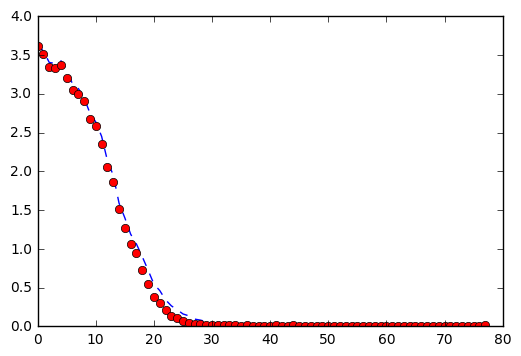

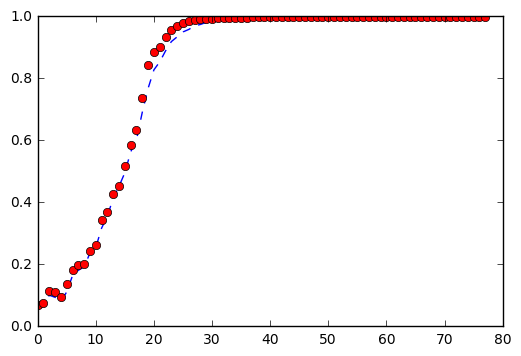

Model saved


In [49]:
x = tf.placeholder(tf.float32, (None, 32, 32, 3))
y = tf.placeholder(tf.int32, (None))
one_hot_y = tf.one_hot(y, 43)
keep_prob = tf.placeholder(tf.float32)

rate =7.3951e-05
print('learning rate = ', rate)
logits = conv_net(x,keep_prob)
#logits = LeNet(x,keep_prob)
cross_entropy = tf.nn.softmax_cross_entropy_with_logits(logits, one_hot_y)
loss_operation = tf.reduce_mean(cross_entropy)
optimizer = tf.train.AdamOptimizer(learning_rate = rate)
training_operation = optimizer.minimize(loss_operation)


correct_prediction = tf.equal(tf.argmax(logits, 1), tf.argmax(one_hot_y, 1))
accuracy_operation = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
saver = tf.train.Saver()

#Add loss in the evaluate function
def evaluate(X_data, y_data):
    num_examples = len(X_data)
    total_accuracy = 0
    total_loss = 0
    sess = tf.get_default_session()
    for offset in range(0, num_examples, BATCH_SIZE):
        batch_x, batch_y = X_data[offset:offset+BATCH_SIZE], y_data[offset:offset+BATCH_SIZE]
        accuracy,_loss = sess.run([accuracy_operation,loss_operation], 
                                  feed_dict={x: batch_x, y: batch_y,keep_prob: 1.0})
        total_accuracy += (accuracy * len(batch_x))
        total_loss += (_loss*len(batch_x))
    return(total_accuracy / num_examples, total_loss / num_examples)

EPOCHS = 100
BATCH_SIZE = 64
DROPOUT = 0.8
EARLY_STOP = 5


with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    num_examples = len(X_train)
    print("Training...")
    print()
    train_acc = []
    valid_acc = []
    train_loss = []
    valid_loss = []
    for i in range(EPOCHS):
        X_train, y_train = shuffle(X_train, y_train)
        for offset in range(0, num_examples, BATCH_SIZE):
            end = offset + BATCH_SIZE
            batch_x, batch_y = X_train[offset:end], y_train[offset:end]
            sess.run(training_operation, feed_dict={x: batch_x, y: batch_y,keep_prob:DROPOUT})

        training_accuracy,training_loss   =   evaluate(X_train, y_train)
        validation_accuracy,validation_loss = evaluate(X_validation, y_validation)
        train_acc.append(training_accuracy)
        valid_acc.append(validation_accuracy)
        train_loss.append(training_loss)
        valid_loss.append(validation_loss)
        print("EPOCH {} ...".format(i+1))
        print("Train Accuracy = {:.4f} ~".format(training_accuracy),
              "Validation Accuracy = {:.3f}".format(validation_accuracy),
              "Train loss = {:.4f}".format(training_loss),
              "Validation loss = {:.3f}".format(validation_loss))
        if len(valid_loss)>7 and \
        valid_loss[-1]>= valid_loss[-2] and valid_loss[-1] >= np.mean(valid_loss[-EARLY_STOP-1:]) and\
        valid_loss[-2]>= valid_loss[-3] and valid_loss[-2] >= np.mean(valid_loss[-EARLY_STOP-2:-2]) and\
        valid_loss[-3]>= valid_loss[-4] and valid_loss[-3] >= np.mean(valid_loss[-EARLY_STOP-3:-3]):
            print('Early stop, last five validation loss mean is ',np.mean(valid_loss[-EARLY_STOP:]))
            break

    plt.plot(train_loss, 'b--',valid_loss,'ro')
    plt.show()
    plt.plot(train_acc, 'b--',valid_acc,'ro')
    plt.show()

    saver.save(sess, 'lenet')
    print("Model saved")

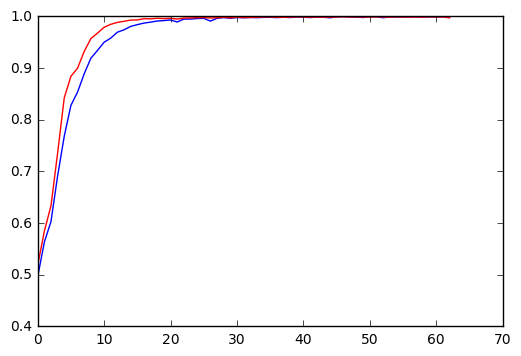

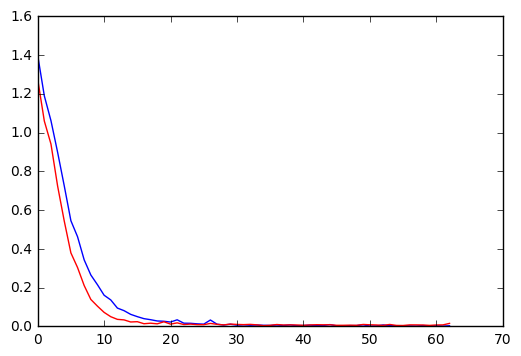

In [50]:
start = 15
plt.plot(train_acc[start:], 'b-',valid_acc[start:],'r-')
plt.savefig('b_size='+str(BATCH_SIZE)+'learn_rate='+str(rate),format='png')
plt.show()

plt.plot(train_loss[start:], 'b-',valid_loss[start:],'r-')
plt.savefig('b_size='+str(BATCH_SIZE)+'learn_rate='+str(rate)+'loss',format='png')
plt.show()

In [36]:
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('.'))

    test_accuracy = evaluate(X_test, y_test)
    print(test_accuracy)

(0.96991290570438049, 0.44048884815860151)


In [51]:
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('.'))

    test_accuracy = evaluate(X_test, y_test)
    print(test_accuracy)

(0.9722090262037747, 0.43345779527383183)


In [ ]:
prediction = tf.argmax(logits, 1)


### Question 1 

_Describe how you preprocessed the data. Why did you choose that technique?_

### Answer:

## Preprocessing method

The preprocessing is to find the invariance and symmetry of images in general and at the time try to avoid customized feature engineering to the specific dataset. 
In the image above, we can clearly seen that there are several universal invariance amount contrast, size, shape. 

1. CLAHE Transform 
2. Data augmentation

http://people.idsia.ch/~juergen/ijcnn2011.pdf
In this paper it shows that the CLAHE Transform did the best among other normalization methods, intuitively it make sense because the high variance of the contrast situation in the original dataset. I'll show the transformed images 

In [37]:
### Generate data additional data (OPTIONAL!)
### and split the data into training/validation/testing sets here.
### Feel free to use as many code cells as needed.

### Question 2

_Describe how you set up the training, validation and testing data for your model. **Optional**: If you generated additional data, how did you generate the data? Why did you generate the data? What are the differences in the new dataset (with generated data) from the original dataset?_

### Answer:

I use skit-learn train_test_split to get 25% data from the training set as a validation set. 
### data augmentation:
For every image randomly generate 10 augmented images

* Motivation:
During training, I found using simple LeNet I can easily overfit the original data set, therefore, data augmentation is helpful to get more data and hopefully get better results.


Note that, I think it's OK for different class have different number of training examples. The assumption is that the distribution of different will reflect the true distribution of all the traffic signs, therefore a bias towards larger number of specific class is actually good thing. Another concern of making number of classes equal is that augmented image can't catch some variations of true data, so for some example if you augment 10 times and have the same number of training examples as the larger class, you can't actually know whether the bias is the same. Therefore when doing data augmentation, I will uniformly augment every image. 



### Question 3

_What does your final architecture look like? (Type of model, layers, sizes, connectivity, etc.)  For reference on how to build a deep neural network using TensorFlow, see [Deep Neural Network in TensorFlow
](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/b516a270-8600-4f93-a0a3-20dfeabe5da6/concepts/83a3a2a2-a9bd-4b7b-95b0-eb924ab14432) from the classroom._


### Answer:

In this project I tried two architecture, first is Lenet:

### Architecture 1 LeNet 
**Layer 1: Convolutional.** The output shape should be 28x28x6.

**Activation.** Relu

**Pooling.** The output shape should be 14x14x6.

**Layer 2: Convolutional.** The output shape should be 10x10x16.

**Activation.** Relu

**Pooling.** The output shape should be 5x5x16.

**Flatten.** Flatten the output shape of the final pooling layer such that it's 1D instead of 3D.

**Layer 3: Fully Connected.** This should have 120 outputs.

**Activation.** Relu

**Layer 4: Fully Connected.** This should have 84 outputs.

**Activation.** Relu

**Layer 5: Fully Connected (Logits).** This should have 10 outputs.

### Output
Return the result of the 2nd fully connected layer.

The second one is similar to the paper  http://people.idsia.ch/~juergen/ijcnn2011.pdf 
I add one more fully connected layer at the end. 

### Architecture 2  
**Layer 1: Convolutional.** The output shape should be 28x28x100. 

**Activation.** Relu

**Pooling.** The output shape should be 14x14x100.

**Layer 2: Convolutional.** The output shape should be 12x12x150.

**Activation.** Relu

**Pooling.** The output shape should be 6x6x150.

**Layer 3: Convolutional.** The output shape should be 5x5x250. 

**Activation.** Relu

**Pooling.** The output shape should be 2x2x250.


**Flatten.** Flatten the output shape of the final pooling layer such that it's 1D instead of 3D. 

**Layer 4: Fully Connected.** This should have 200 outputs.

**Activation.** Relu and Drop out

**Layer 5: Fully Connected (Logits).** This should have 43 outputs.

### Output
Return the result of the 3nd fully connected layer.




### Question 4

_How did you train your model? (Type of optimizer, batch size, epochs, hyperparameters, etc.)_


### Answer:
* Optimizer
I choose Adam optimizer, it works well.


* Batch size
I tried batch size from 8 16, 32 ... to 1024
The smaller the batch size, the faster the network converges, however if the number is too small (like 8)
It oscillating a lot and couldn't converge to a good result.


* Epochs
Since I am using my local machine, I want make the most use out of it, generally I set number of epochs to 50, also I implement my own version of early stop(not exactly the same as other's) basically monitoring the recent few training loss, if it is larger than the average of last 5 then stop.


* Learning rate
Learning rate is by far the most tricky one. I did randomize search between 10^-3 to 10^-7 for the larger network. I found something really strange for the large network. When my learning rate is > 10^-4. It almost always died at 0.057 accuracy. when I set between 10^-4-10^-5 sometimes dies sometimes doesn't and give a really good result within 50 EPOCH. (99.7% validation accuracy) Smaller 10^5 to 10^6 it almost always shows potential but too slow, only get 10% accuracy at 20% accuracy at 50 EPOCH. Also, with same initialization, I can get totally different behavior. I suppose this is something to do with the initialization, Maybe I'll try the Xavier if I have time later. I kept one of the experiment in this note book, please leave a comment if you know what's happening.


* Dropout rate
This is really powerful way to regularization, With even 0.99 rate the distance between training accuracy and testing accuracy decrease dramatically. Without it, if I let the network to train too long, it almost always end up overfitting. On the other hand if the dropout rate is too low, the system is very unstable. I choose 0.8 it performs well.



### Question 5


_What approach did you take in coming up with a solution to this problem? It may have been a process of trial and error, in which case, outline the steps you took to get to the final solution and why you chose those steps. Perhaps your solution involved an already well known implementation or architecture. In this case, discuss why you think this is suitable for the current problem._

### Answer:
I tried LeNet first, it give me pretty good result with a short time, so I read more about the traffic sign classification, I tried various way of preprocessing, and built a larger network with more layers compare to LeNet, the idea is the task is basically similar to the task of identifying the handwritings. 
The main difference are:
1. This project has more inputs and classes 
2. This project has color image instead of a grayscale image 
3. The images from this data set was taken in various lighting conditions, result in a data set has high variance in the contrast. 
After data augmentation, I found it's very likely to overfit data, so I add dropout. 




---

## Step 3: Test a Model on New Images

Take several pictures of traffic signs that you find on the web or around you (at least five), and run them through your classifier on your computer to produce example results. The classifier might not recognize some local signs but it could prove interesting nonetheless.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [ ]:
### Load the images and plot them here.
### Feel free to use as many code cells as needed.

### Question 6

_Choose five candidate images of traffic signs and provide them in the report. Are there any particular qualities of the image(s) that might make classification difficult? It could be helpful to plot the images in the notebook._



**Answer:**

(32, 32, 3)


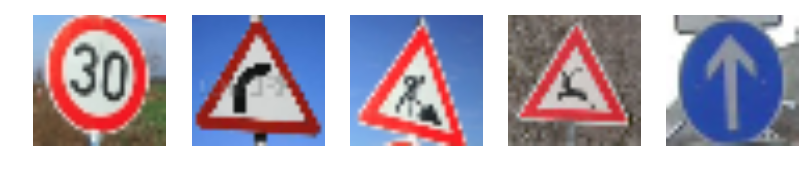

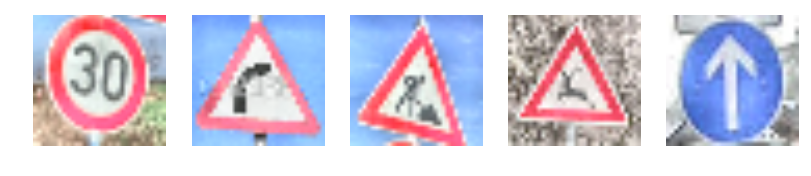

In [99]:
# load test images
from skimage import io
import numpy as np
import matplotlib.image as mpimg


new_image = np.empty(shape=( 32, 32, 3), dtype=np.uint8)
raw_images=[]
transfered_images = []
l = [1,20,25,31,35]
test_imgs = []
for i in range(len(l)):
    new_image = cv2.resize(cv2.imread('/home/luke/Pictures/{}.png'.format(str(l[i]))),(32,32))
    raw_images.append(cv2.cvtColor(new_image, cv2.COLOR_BGR2RGB))
# src.create(32, 32, CV_8UC1);
# src = imread(cv2.resize(
#                     mpimg.imread('/home/luke/Pictures/{}.png'.format(str(l[i]))),(32,32)), CV_8UC1);
print(new_image.shape)
plt.figure(figsize=(16, 16))
for i in range(len(raw_images)):
    plt.subplot(8, 8, i+1)
    plt.axis('off')
    plt.imshow(raw_images[i])
    transfered_images.append(CLAHE_transform(raw_images[i]))
plt.figure(figsize=(16, 16))

for i in range(len(raw_images)):
    plt.subplot(8, 8, i+1)
    plt.axis('off')
    plt.imshow(transfered_images[i])    


In [73]:
prediction = tf.argmax(logits, 1)


In [105]:
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('.'))

    predict = sess.run(prediction, feed_dict={x: raw_images, keep_prob:1.0})
    predict1 = sess.run(prediction, feed_dict={x: transfered_images, keep_prob:1.0})

    print("Prediction with raw image:             ", predict)
    print("Prediction after CLAHE transformation: ", predict1)
    print("Ground Truth:                          ", l)

Prediction with raw image:              [ 1 30 25 31 35]
Prediction after CLAHE transformation:  [ 1 20 25 31 35]
Ground Truth:                           [1, 20, 25, 31, 35]


### Question 7

_Is your model able to perform equally well on captured pictures when compared to testing on the dataset? The simplest way to do this check the accuracy of the predictions. For example, if the model predicted 1 out of 5 signs correctly, it's 20% accurate._

_**NOTE:** You could check the accuracy manually by using `signnames.csv` (same directory). This file has a mapping from the class id (0-42) to the corresponding sign name. So, you could take the class id the model outputs, lookup the name in `signnames.csv` and see if it matches the sign from the image._


### Answer:

The model give a very good estimation on the real data, although the real data is kind different(blurred by resizing) It received 100% accuracy on 5 images.  

However interestingly, I found that without doing transform, it doesn't give a 100% accuracy. But to my eyes, there is not much difference before or after transformation. Actually, it's easier for me to recognize the image without the transformation. 


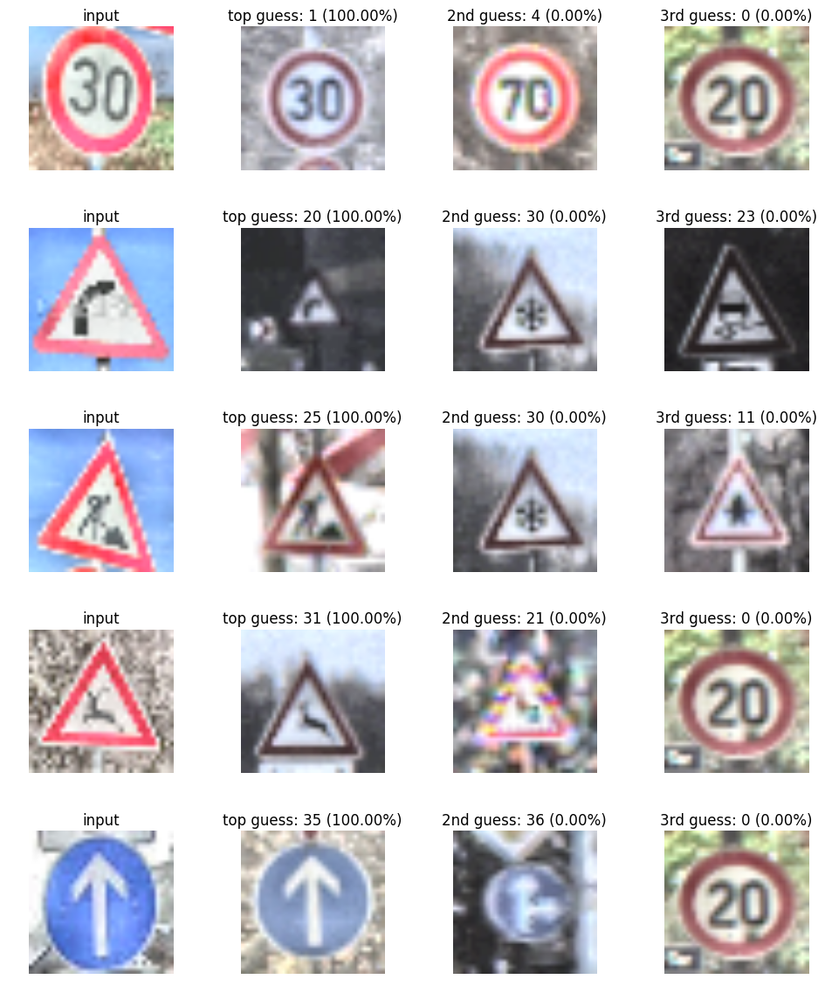

In [110]:
### Visualize the softmax probabilities here.
### Feel free to use as many code cells as needed.
def visulize_prediction(transfered_images):
    softmax_logits = tf.nn.softmax(logits)
    top_k = tf.nn.top_k(softmax_logits, k=3)
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        saver = tf.train.import_meta_graph('./lenet.meta')
        saver.restore(sess, "./lenet")
        my_softmax_logits = sess.run(softmax_logits, feed_dict={x: transfered_images, keep_prob: 1.0})
        my_top_k = sess.run(top_k, feed_dict={x: transfered_images, keep_prob: 1.0})


        fig, axs = plt.subplots(len(transfered_images),4, figsize=(12, 14))
        fig.subplots_adjust(hspace = .4, wspace=.2)
        axs = axs.ravel()

        for i, image in enumerate(transfered_images):
            axs[4*i].axis('off')
            axs[4*i].imshow(image)
            axs[4*i].set_title('input')
            guess1 = my_top_k[1][i][0]
            index1 = np.argwhere(y_validation == guess1)[0]
            axs[4*i+1].axis('off')
            axs[4*i+1].imshow(X_validation[index1].squeeze())
            axs[4*i+1].set_title('top guess: {} ({:.2f}%)'.format(guess1, 100*my_top_k[0][i][0]))
            guess2 = my_top_k[1][i][1]
            index2 = np.argwhere(y_validation == guess2)[0]
            axs[4*i+2].axis('off')
            axs[4*i+2].imshow(X_validation[index2].squeeze())
            axs[4*i+2].set_title('2nd guess: {} ({:.2f}%)'.format(guess2, 100*my_top_k[0][i][1]))
            guess3 = my_top_k[1][i][2]
            index3 = np.argwhere(y_validation == guess3)[0]
            axs[4*i+3].axis('off')
            axs[4*i+3].imshow(X_validation[index3].squeeze())
            axs[4*i+3].set_title('3rd guess: {} ({:.2f}%)'.format(guess3, 100*my_top_k[0][i][2]))
visulize_prediction(transfered_images)

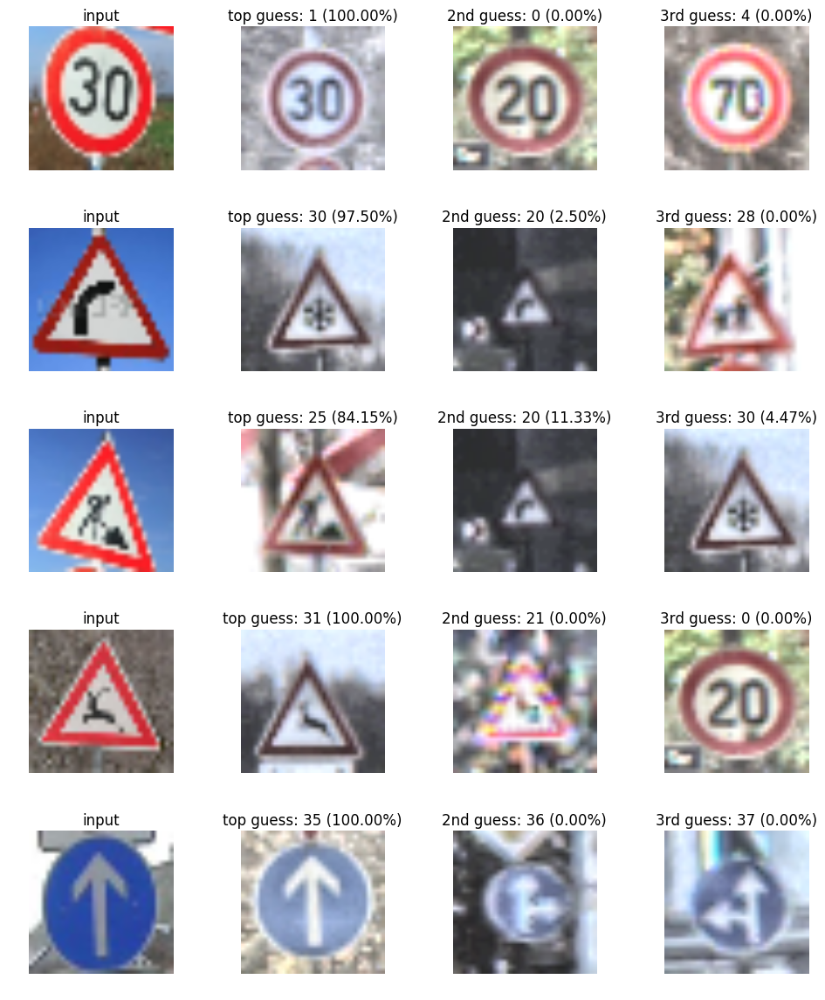

In [111]:
visulize_prediction(raw_images)

### Question 8

*Use the model's softmax probabilities to visualize the **certainty** of its predictions, [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.12/api_docs/python/nn.html#top_k) could prove helpful here. Which predictions is the model certain of? Uncertain? If the model was incorrect in its initial prediction, does the correct prediction appear in the top k? (k should be 5 at most)*

`tf.nn.top_k` will return the values and indices (class ids) of the top k predictions. So if k=3, for each sign, it'll return the 3 largest probabilities (out of a possible 43) and the correspoding class ids.

Take this numpy array as an example:

```
# (5, 6) array
a = np.array([[ 0.24879643,  0.07032244,  0.12641572,  0.34763842,  0.07893497,
         0.12789202],
       [ 0.28086119,  0.27569815,  0.08594638,  0.0178669 ,  0.18063401,
         0.15899337],
       [ 0.26076848,  0.23664738,  0.08020603,  0.07001922,  0.1134371 ,
         0.23892179],
       [ 0.11943333,  0.29198961,  0.02605103,  0.26234032,  0.1351348 ,
         0.16505091],
       [ 0.09561176,  0.34396535,  0.0643941 ,  0.16240774,  0.24206137,
         0.09155967]])
```

Running it through `sess.run(tf.nn.top_k(tf.constant(a), k=3))` produces:

```
TopKV2(values=array([[ 0.34763842,  0.24879643,  0.12789202],
       [ 0.28086119,  0.27569815,  0.18063401],
       [ 0.26076848,  0.23892179,  0.23664738],
       [ 0.29198961,  0.26234032,  0.16505091],
       [ 0.34396535,  0.24206137,  0.16240774]]), indices=array([[3, 0, 5],
       [0, 1, 4],
       [0, 5, 1],
       [1, 3, 5],
       [1, 4, 3]], dtype=int32))
```

Looking just at the first row we get `[ 0.34763842,  0.24879643,  0.12789202]`, you can confirm these are the 3 largest probabilities in `a`. You'll also notice `[3, 0, 5]` are the corresponding indices.

### Answer:

As the graph above shows, the network predict almost 100% accuracy for all the transformed images. That's reasonable, since these image are found in google search" Germen traffic signs" and the network is build based on the transfered image. 

The interesting part is for the raw image. We can find most of the predictions are still accurate. However for the second one, although the true label is the second choice but it only get 2% probability. The reason I think is the watermark on the image, without the transform, the network confuse the watermark as some structure. After the transform however, the network seems to recognize it as noise. 

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.